In [1]:
library(dplyr)
library(stringr)
library(Seurat) # Seurat v4.1.0
library(ggplot2)
library(RColorBrewer)
library(viridis)
library(ggrepel)
library(reshape2)
library(ggbeeswarm)
library(ggpubr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SeuratObject

Loading required package: sp

‘SeuratObject’ was built under R 4.3.1 but the current version is
4.3.2; it is recomended that you reinstall ‘SeuratObject’ as the ABI
for R may have changed

‘SeuratObject’ was built with package ‘Matrix’ 1.6.3 but the current
version is 1.6.5; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect


Loading required package: viridisLite



In [2]:
jz.save.umap.coord <- function(object) {
    # saves the UMAP embedding to the metadata 
    umapCoord <- as.data.frame(Embeddings(object = object[["umap"]]))
    object@meta.data$UMAP1 = umapCoord[,1]
    object@meta.data$UMAP2 = umapCoord[,2]
    return(object)
}

In [3]:
jz.checkgene = function(srat,gene){
    genes = rownames(srat)
    genes[startsWith(genes,gene)]
}

In [175]:
group.col=c('Alum-pSer'='#0072B2','SMNP'='#E69F00','Alum-pSer/SMNP'='#009E73')
Axis_themes <- theme(plot.title = element_text(size = 8,hjust=0.5),
                     axis.title = element_text(size = 8),
                     axis.text = element_text(size = 8,color='black'),
                     axis.text.x = element_text(size = 8,angle=45,hjust=1),                     
                     legend.text = element_text(size = 8),
                     legend.title = element_text(size = 8),
                     legend.key.size = unit(.3, 'cm'),
                     strip.text.x = element_text(size = 8),
                     strip.background = element_rect(fill=NA,linewidth=.3,color='black'),
                     axis.line = element_line(linewidth = .3),
                     axis.ticks = element_line(linewidth = 0.3))

In [255]:
# srat = readRDS('seurat_object/00_harmony_integrated.RDS')
# srat
# srat$group = 'Alum-pSer/SMNP'
# srat$group[srat$orig.ident %in% c('AG2','AQ2','P1','P2','P3','P4')] = 'Alum-pSer'
# srat$group[srat$orig.ident %in% c('AG1','AQ1')] = 'SMNP'
# srat$mouse.id = paste(srat$orig.ident, str_split_i(srat$hash.ID,'\\.',1),sep = '_')
# # Alum-pSer/SMNP AQ3 and AQ4 are split from the same pool
# srat$mouse.id[srat$orig.ident %in% c('AQ3','AQ4')] = paste(substr(srat$orig.ident[srat$orig.ident %in% c('AQ3','AQ4')],1,2), 
#                                                            str_split_i(srat$hash.ID[srat$orig.ident %in% c('AQ3','AQ4')],'\\.',1),sep = '_')
# saveRDS(srat, 'seurat_object/00_harmony_integrated.RDS')

In [9]:
#srat = readRDS('seurat_object/00_cca_integrated.RDS')
srat = readRDS('seurat_object/00_harmony_integrated.RDS')
srat$group = factor(srat$group, levels=c('Alum-pSer','SMNP','Alum-pSer/SMNP'))
srat = jz.save.umap.coord(srat)
srat

An object of class Seurat 
26779 features across 19537 samples within 2 assays 
Active assay: RNA (26769 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 1 other assay present: HTO
 3 dimensional reductions calculated: pca, harmony, umap

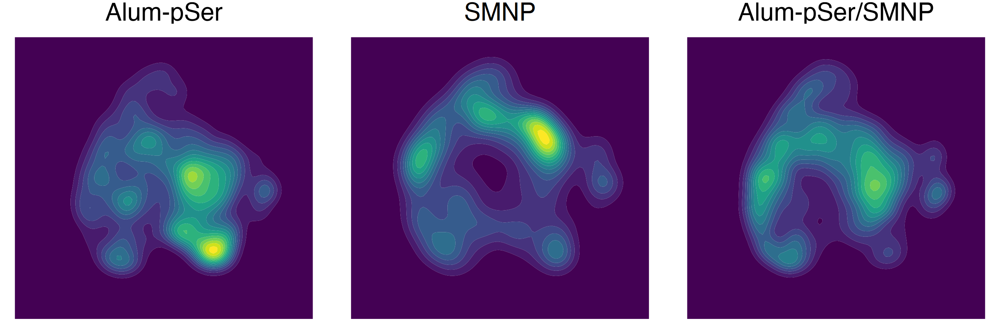

In [10]:
options(repr.plot.width=9, repr.plot.height=3,repr.plot.res=300)

metadata = srat@meta.data

metadata %>% 
ggplot(aes(x=UMAP1, y=UMAP2)) + theme_void()+ NoLegend()+
geom_density_2d_filled(bins=15) + 
scale_fill_viridis_d()+ 
facet_wrap('group') + 
xlim(-10,10) + ylim(-6,6)+
theme(strip.text=element_text(size=16))

[1] 6480
[1] 3042


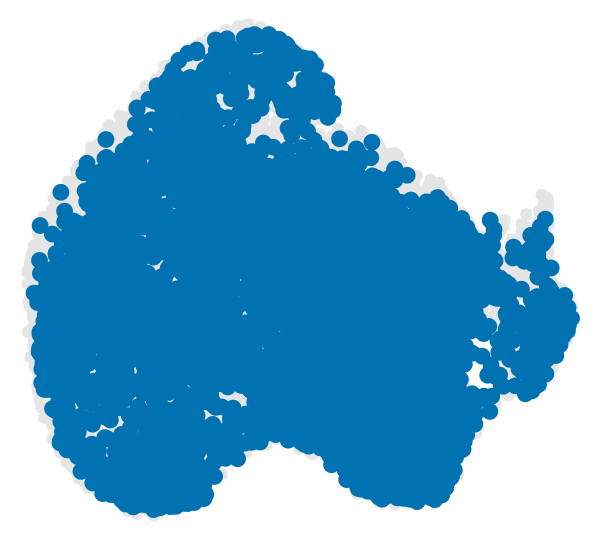

[1] 10015


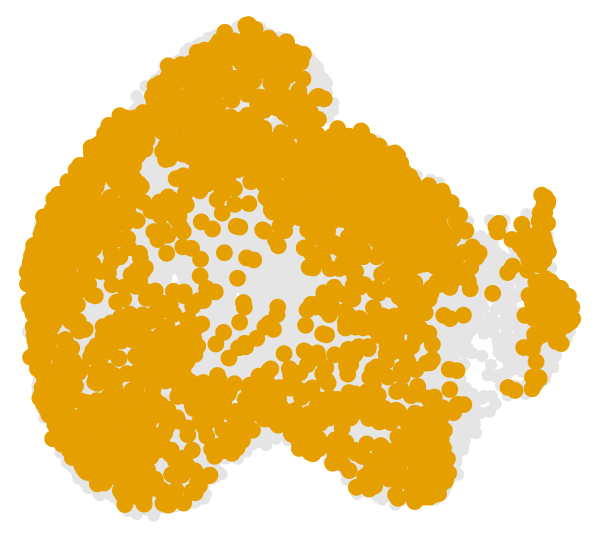

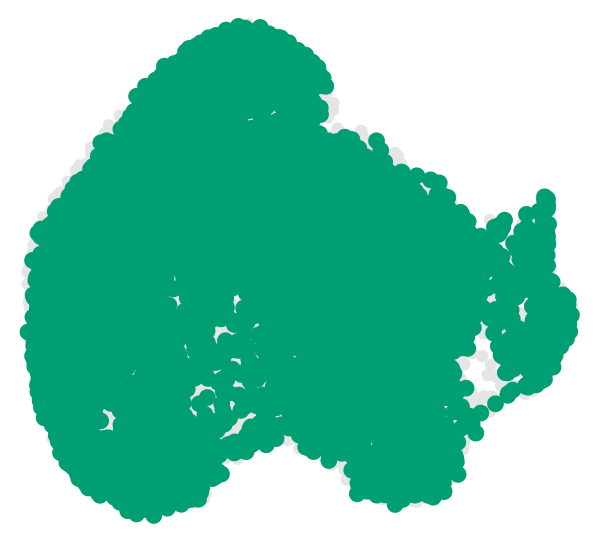

In [11]:
options(repr.plot.width=2, repr.plot.height=1.8,repr.plot.res=300)
cp=ggthemes::ggthemes_data[["tableau"]][["color-palettes"]][["regular"]]$`Classic 10`$value
cp=c('#0072B2','#E69F00','#009E73')
metadata = srat@meta.data
groups=c('Alum-pSer','SMNP','Alum-pSer/SMNP')

#cp=c(cp[1],cp[3:4])
for (i in seq(3)) {
    curr.group = groups[i]
    metadata2 = metadata%>%filter(group==curr.group)
    p=metadata %>% 
    ggplot(aes(x=UMAP1,y=UMAP2))+ theme_void()+NoLegend()+
    geom_point(color='grey90',size=0.5)+
    geom_point(data=metadata2,aes(x=UMAP1,y=UMAP2),color=cp[i],size=1) +
    #labs(title=sprintf('%s (n=%d)',group,nrow(metadata2)))+ 
    theme(plot.title=element_text(hjust=0.5,size=20)) 
    print(nrow(metadata2))
    show(p)
}


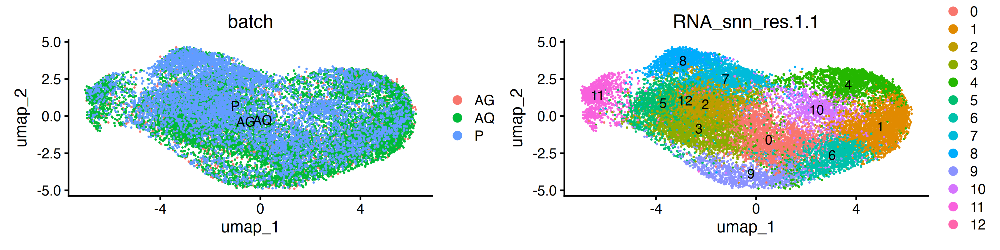

In [86]:
options(repr.plot.height=3, repr.plot.width=12, repr.plot.res=300)
srat = RunUMAP(srat, reduction = "harmony", dims = 1:50, min.dist = 0.4,verbose=FALSE)
DimPlot(srat, group.by=c('batch','RNA_snn_res.1.1'), label=TRUE)

In [146]:
#df %>% filter(avg_log2FC>0) %>% arrange(desc(pct.1-pct.2)) %>% head(30)

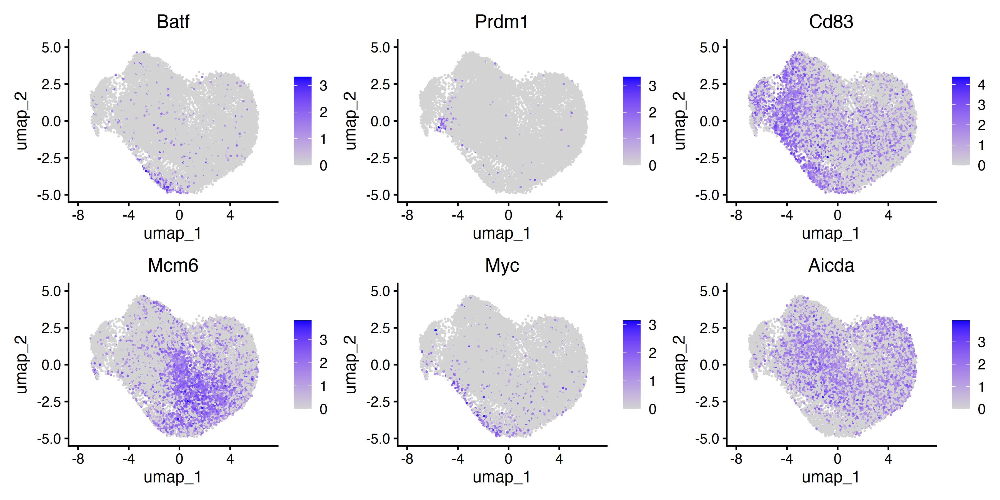

In [87]:
options(repr.plot.height=6, repr.plot.width=12, repr.plot.res=300)
FeaturePlot(srat,c('Batf','Prdm1','Cd83','Mcm6','Myc','Aicda'),ncol=3)

In [371]:
srat = FindNeighbors(srat, reduction = "harmony", dims = 1:15, n.trees = 50, verbose=FALSE)
srat = FindClusters(srat, resolution = c(0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.1,1.3), 
                    algorithm = 2, #algorithm = 2,
                    verbose=FALSE)
# srat = RunUMAP(srat, reduction = "integrated.cca", dims = 1:20, min.dist = 0.3,verbose=FALSE)


In [397]:
Idents(srat) = 'RNA_snn_res.1.1'
df= FindMarkers(srat,7,c(2,3,8))


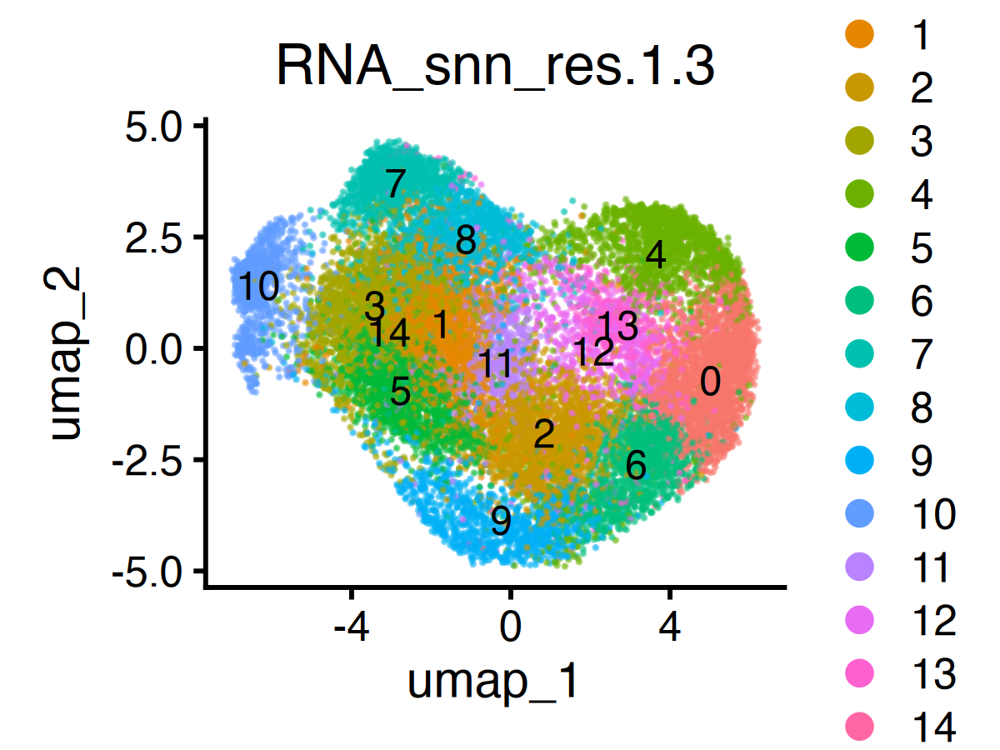

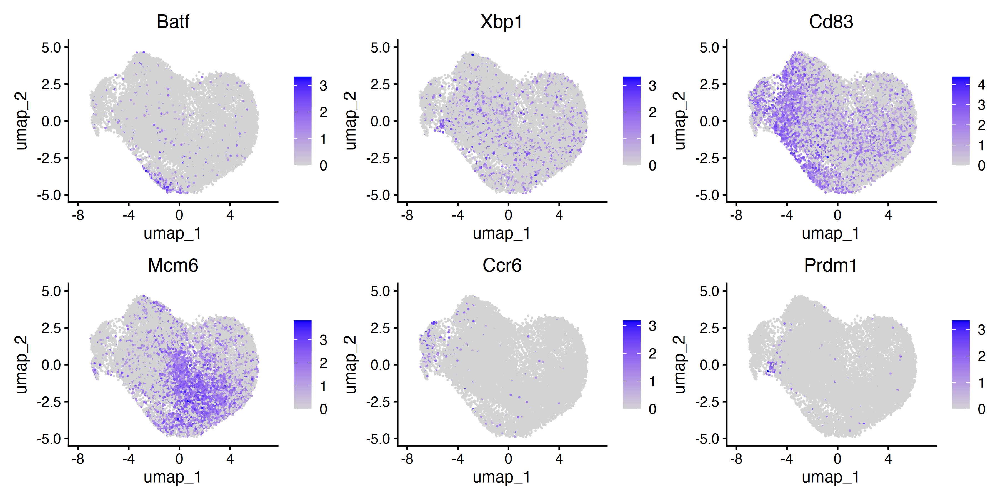

In [386]:
options(repr.plot.height=3, repr.plot.width=4, repr.plot.res=300)
DimPlot(srat, group.by=c('RNA_snn_res.1.3'), pt.size=0.1,label=TRUE,alpha=0.5)
options(repr.plot.height=6, repr.plot.width=12, repr.plot.res=300)
FeaturePlot(srat,c('Batf','Xbp1','Cd83','Mcm6','Ccr6','Prdm1'),ncol=3)
# 3,5,7 LZ
# 8,14 DZ G1
# 1,11,2,6,12 S
# 0,4,13 Cycling
# 9 transition 
# 10 MBC+PD

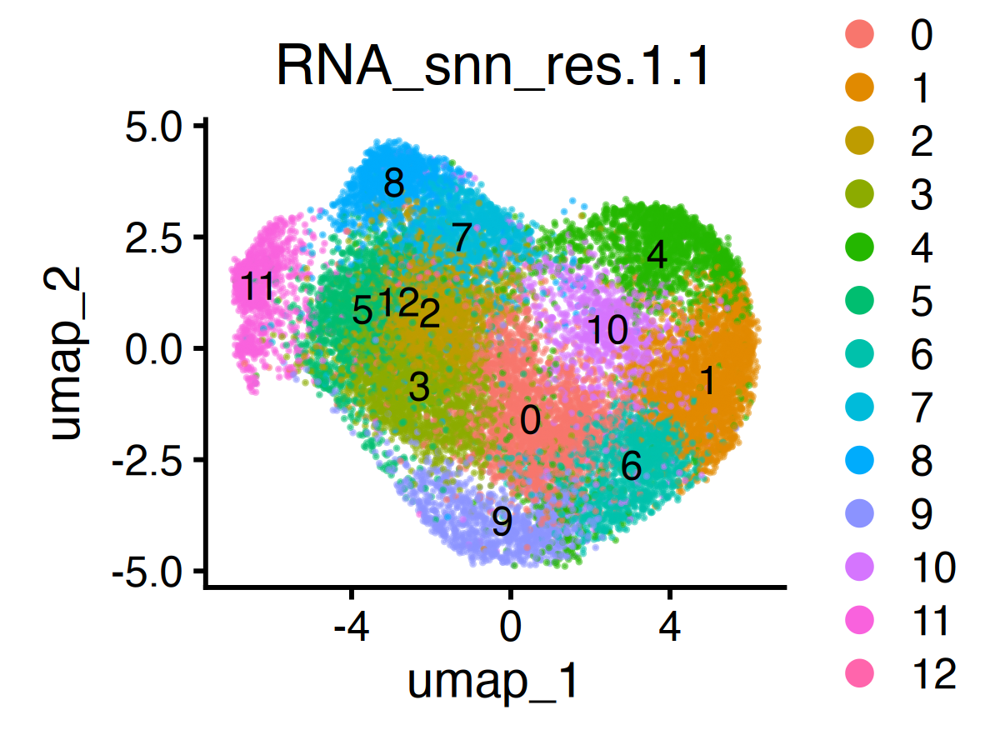

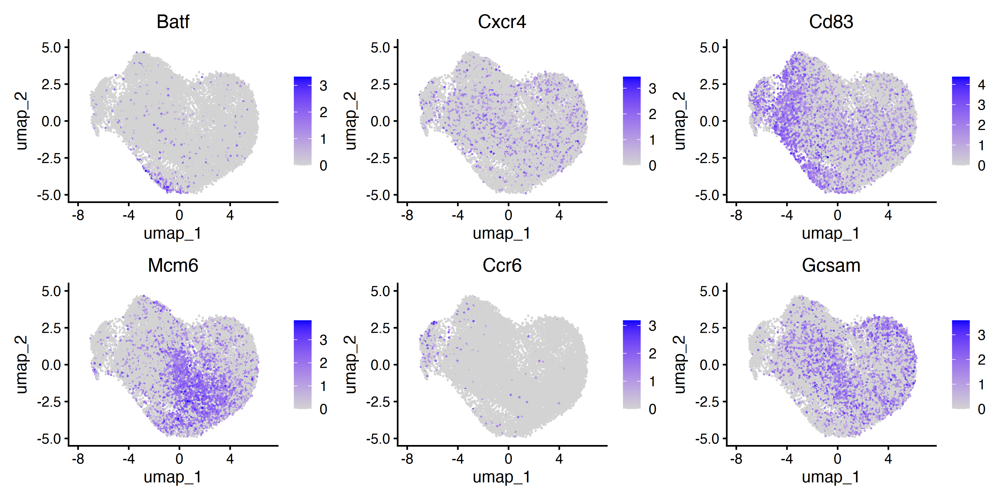

In [392]:
options(repr.plot.height=3, repr.plot.width=4, repr.plot.res=300)
DimPlot(srat, group.by=c('RNA_snn_res.1.1'), pt.size=0.1,label=TRUE,alpha=0.5)
options(repr.plot.height=6, repr.plot.width=12, repr.plot.res=300)
FeaturePlot(srat,c('Batf','Cxcr4','Cd83','Mcm6','Ccr6','Gcsam'),ncol=3)
# 5,8,12 LZ
# 2,3,7,12 DZ G1
# 0,6 S
# 1,4,10 Cycling
# 9 transition 
# 11 MBC+PD

In [154]:
pd = subset(srat, subset= Prdm1>0 | Xbp1>0 | Sdc1>0)
pd

An object of class Seurat 
26779 features across 2881 samples within 2 assays 
Active assay: RNA (26769 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 1 other assay present: HTO
 3 dimensional reductions calculated: pca, harmony, umap

In [155]:
pd <- ScaleData(pd,verbose=FALSE)
pd <- RunPCA(pd,verbose=FALSE)

In [156]:
pd <- FindNeighbors(pd, reduction = "harmony", dims = 1:30, verbose=FALSE)
pd <- RunUMAP(pd, reduction = "harmony", dims = 1:30, verbose=FALSE)
pd <- FindClusters(pd, resolution = c(0.1,0.3,0.5), verbose=FALSE)

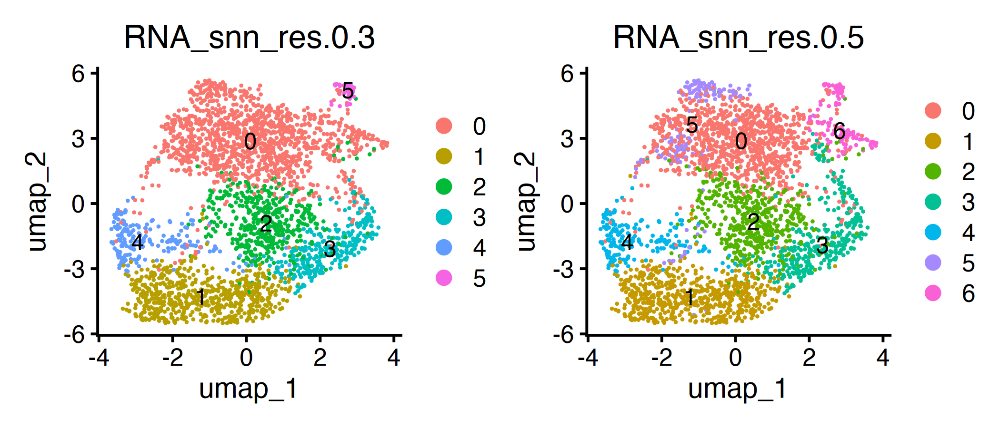

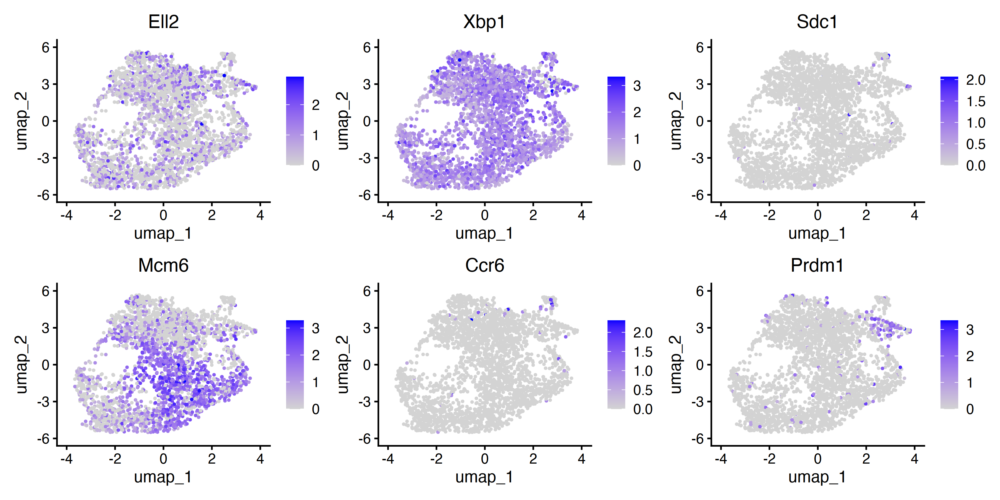

In [167]:
options(repr.plot.height=3, repr.plot.width=7, repr.plot.res=300)
DimPlot(pd, group.by=c('RNA_snn_res.0.3','RNA_snn_res.0.5'), pt.size=0.1,label=TRUE)
options(repr.plot.height=6, repr.plot.width=12, repr.plot.res=300)
FeaturePlot(pd,c('Ell2','Xbp1','Sdc1','Mcm6','Ccr6','Prdm1'),ncol=3)

In [168]:
pd = subset(pd, subset=RNA_snn_res.0.5==6 & RNA_snn_res.0.3!=5)
pd

An object of class Seurat 
26779 features across 86 samples within 2 assays 
Active assay: RNA (26769 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 1 other assay present: HTO
 3 dimensional reductions calculated: pca, harmony, umap

In [387]:
# 5,8,12 LZ
# 2,3,7,12 DZ G1
# 0,6 S
# 1,4,10 Cycling
# 9 transition 
# 11 MBC+PD
srat$phenocluster = 'Unknown'
srat$phenocluster[srat$RNA_snn_res.1.1 %in% c(5,8,12)] = 'C3'
srat$phenocluster[srat$RNA_snn_res.1.1 %in% c(2,3,7)] = 'C7'
srat$phenocluster[srat$RNA_snn_res.1.1 %in% c(0,6)] = 'C5'
srat$phenocluster[srat$RNA_snn_res.1.1 %in% c(1,4,10)] = 'C6'
srat$phenocluster[srat$RNA_snn_res.1.1 %in% c(9)] = 'C4'
srat$phenocluster[srat$RNA_snn_res.1.1 %in% c(11)] = 'C2'

srat$phenocluster[srat$cell_id %in% pd$cell_id] = 'C1'


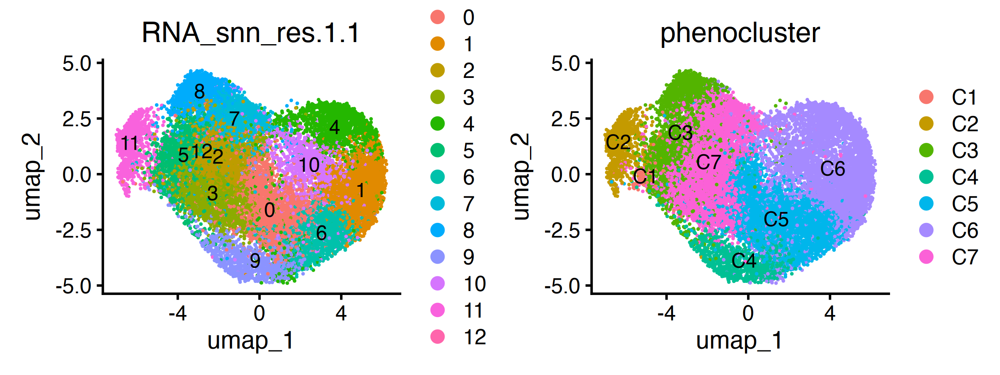

In [388]:
options(repr.plot.height=3, repr.plot.width=8, repr.plot.res=300)
DimPlot(srat, group.by=c('RNA_snn_res.1.1','phenocluster'), pt.size=0.1,label=TRUE)


In [325]:
#saveRDS(srat,'seurat_object/01_harmony_labeled.RDS')

In [326]:
# for anndata filtering 
# srat = jz.save.umap.coord(srat)
# write.csv(srat@meta.data, 'seurat_object/01_harmony_labeled.csv')

In [190]:
myc.targets = c("Abce1", "Acsl1", "Ahcy", "Aimp2", "Ak4", "Akap1", "Atp1b3", "Auh", "Bop1", "Cad", "Cdk4", "Cebpz", "Ctps1", "Ctsc", "Cycs", "Cyp51", "Dancr", "Dcun1d4", "Ddx10", "Ddx21", "Dhodh", "Ebna1bp2", "Exosc2", "Exosc7", "Fabp5", "Fasn", "Fkbp4", "Fxn", "Gcsh", "Gpd1l", "Grsf1", "Hspe1", "Iars1", "Impdh2", "Ldha", "Lrp8", "Mest", "Mgst1", "Mrpl3", "Mthfd1", "Mxi1", "Myc", "Nampt", "Nefh", "Nme1", "Nolc1", "Odc1", "Paics", "Pebp1", "Pno1", "Pold2", "Polr2h", "Ppat", "Prdx4", "Prps2", "Pum3", "Pycr1", "Rabepk", "Ranbp1", "Rcc1", "Rpia", "Rrp1b", "Rrs1", "Slc16a1", "Slc20a1", "Slc39a14", "Slc39a6", "Sord", "Srm", "Srpk1", "Tarbp1", "Tbl3", "Tfrc", "Tmem97", "Trap1", "Uchl3", "Uck2", "Vars1", "Vrk1", "Znf239")
e2f.targets = c("Bard1", "Brd2", "Bub3", "Cbx5", "Ccna2", "Cdc25a", "Cdc6", "Cdk1", "Cdk2", "Cenpa", "Cenpe", "Chek1", "Cks1bp7", "Cstf1", "Dbf4", "Dut", "E2f2", "E2f3", "Fen1", "H2ac18", "H2ac6", "H2ax", "H2az1", "H2bc21", "H3c4", "Hltf", "Hmgb1", "Hmgb3", "Mad2l1", "Mcm3", "Mcm5", "Mcm6", "Mlh1", "Msh2", "Nap1l4", "Ndc80", "Orc1", "Pcna", "Pola1", "Pola2", "Pold1", "Prim2", "Prkdc", "Pttg1", "Rad51", "Rad54l", "Rb1", "Rbl1", "Rfc2", "Rfc3", "Rfc4", "Rpa3", "Rrm1", "Smc2", "Smc4", "Supt4h1", "Tk1", "Top2a", "Tp53", "Ttk", "Umps", "Ung")
mtorc1.targets = c("Adrm1", "Ahsa1", "Aldh4a1", "Atf5", "Atp5g1", "Atp5g3", "Bmp1", "Btk", "Bysl", "C8orf41", "Calu", "Cct5", "Cct6a", "Cdk4", "Chuk", "Copb2", "Cse1l", "Eif2b4", "Eif4g2", "Emp3", "Fam89b", "Fasn", "Hccs", "Hmhb1", "Hspa4", "Hspa8", "Hspe1", "Hyou1", "Id2", "Ifi30", "Imp4", "Jtb", "Lrrc32", "Mllt11", "Mmp15", "Mrpl12", "Mrps11", "Ndufa9", "Npm3", "Pfkm", "Pgk1", "Prmt1", "Psmd5", "Psmd8", "Ptbp1", "Rabepk", "Rabggtb", "Safb", "Sf3a3", "Sit1", "Slc29a1", "Snrpc", "Sqle", "Srm", "Tceb3", "Tfrc", "Tgds", "Timm17a", "Tmed2", "Tmem109", "Ube2l3", "Wnt10b", "Znf259")

In [191]:
test = srat
test = AddModuleScore(test, features=list(myc.targets,e2f.targets,mtorc1.targets))
test@meta.data = test@meta.data %>% rename('Myc_Targets' = 'Cluster1','E2f_Targets' = 'Cluster2','mTORC1_Targets' = 'Cluster3')

Warning message:
“The following features are not present in the object: Mgst1, Nme1, Znf239, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Cks1bp7, H2ac18, Supt4h1, Tp53, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Aldh4a1, Atp5g1, Atp5g3, C8orf41, Fam89b, Hmhb1, Tceb3, Znf259, not searching for symbol synonyms”


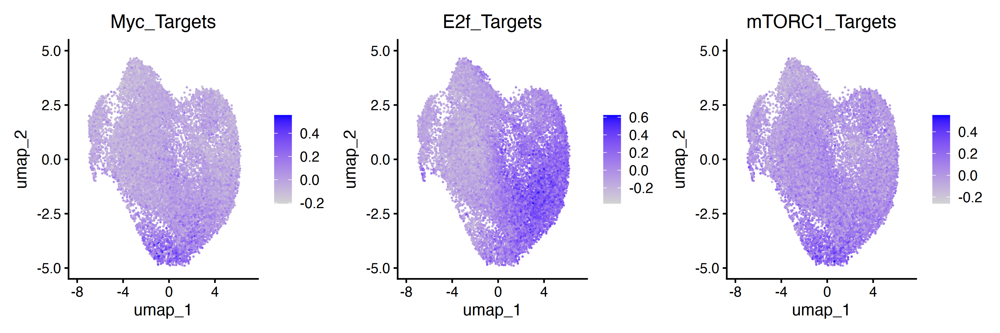

In [193]:
options(repr.plot.width=12, repr.plot.height=4)
FeaturePlot(test,c('Myc_Targets','E2f_Targets','mTORC1_Targets'), ncol=3)

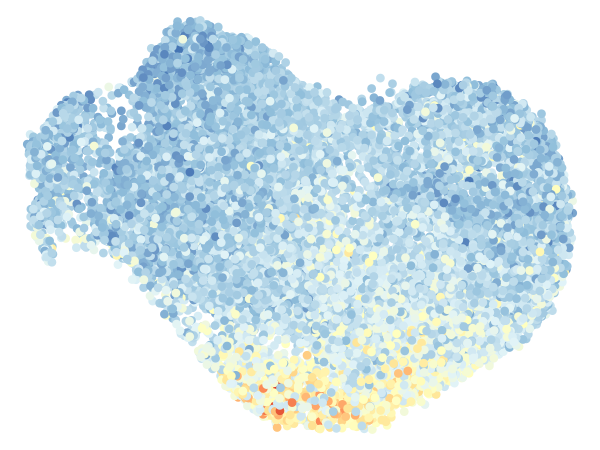

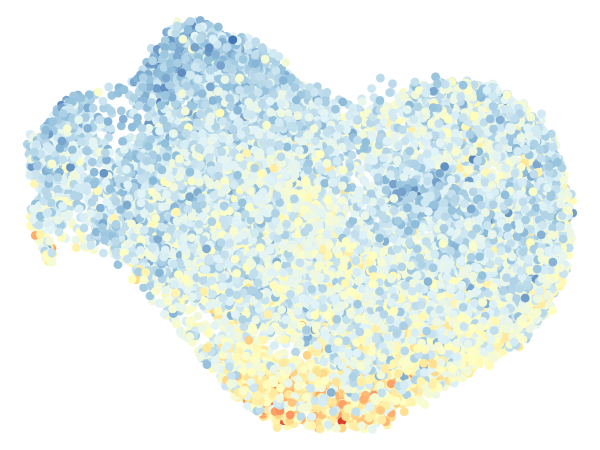

In [197]:
options(repr.plot.width=2, repr.plot.height=1.5,repr.plot.res=300)

metadata = test@meta.data

metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=Myc_Targets))+ theme_void()+ NoLegend()+
geom_point(size=.1)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1)  

metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=mTORC1_Targets))+ theme_void()+ NoLegend()+
geom_point(size=.1)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1)  
